<div align=center>
		
<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
<font color=#4d7db8>
Sharif University of Technology - Department of Electrical Engineering
</font>
<p></p>
<font color=#4d7db8>
Introduction To Machine Learning - Dr. Sajjad Amini
</font>
<br/>
<br/>
Spring Semester 1401-02

<div/>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
Project - 3rd Phase
<br />
Image Super Resolution using Autoencoder
			</font>
    <br/>
<font size=4>
			<br/><br/>
Due on Tir 10th
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=green>
Should you have any questions concerning the project, please feel free to ask via Telegram.
     </font>
</font>
                <br/>
    </div>

# Personal Info
<hr/>
    <div class="column" align=center>
    <font size=4>
        <div class="column">
        <br />
            student_number = 99102531
            <br />
            Name = Amir Mohammad   
            <br />
            Last_Name = Yousefi 
        </div>
        <div class="column">
        <br />
            student_number = 99102394
            <br />
            Name = Seyed Mohsen   
            <br />
            Last_Name = Nasiri 
        </div>
    </font>
    </div>


1. Download the "image super resolution (from unsplash)" dataset and split it's validation set to new validation set and test set.
2. Design and train an AutoEncoder using `PyTorch` (not `TensorFlow`) on the dataset to enhance the resolution of images from low resolution to high resolution.
3. plot learning curve and visualize low resolution images of test set, their corresponding high resolution images and their reconstructed versions side by side.

# Import Necessary Libraries

In [1]:
import pandas as pd 
import os
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
from matplotlib import pyplot as plt
from typing import Dict
from torchvision import datasets, transforms
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import cv2
from tensorflow.keras.preprocessing.image import img_to_array
from sklearn.model_selection import train_test_split

# Load Dataset and Prepare It

In [2]:
folder_path = 'C:/Users/smnas/Image Super Resolution - Unsplash'
high_res_folder = os.path.join(folder_path, 'high res')
low_res_folder = os.path.join(folder_path, 'low res')

In [3]:
image_path = pd.read_csv("C:/Users/smnas/Image Super Resolution - Unsplash/image_data.csv")
image_path['low_res'] = image_path['low_res'].apply(lambda x: os.path.join(low_res_folder,x))
image_path['high_res'] = image_path['high_res'].apply(lambda x: os.path.join(high_res_folder,x))
image_path.head()

,low_res,high_res
0,C:/Users/smnas/Image Super Resolution - Unspla...,C:/Users/smnas/Image Super Resolution - Unspla...
1,C:/Users/smnas/Image Super Resolution - Unspla...,C:/Users/smnas/Image Super Resolution - Unspla...
2,C:/Users/smnas/Image Super Resolution - Unspla...,C:/Users/smnas/Image Super Resolution - Unspla...
3,C:/Users/smnas/Image Super Resolution - Unspla...,C:/Users/smnas/Image Super Resolution - Unspla...
4,C:/Users/smnas/Image Super Resolution - Unspla...,C:/Users/smnas/Image Super Resolution - Unspla...


In [4]:
train_df, other_df = train_test_split(image_path, test_size=0.85)
others, test_df = train_test_split(other_df, test_size=0.07)
HIGH_RES_ARRAY_LIST = []
LOW_RES_ARRAY_LIST = []

In [5]:
for x_high_res,x_low_res in zip(train_df.high_res,train_df.low_res):
    
    READING_high = cv2.cvtColor(cv2.imread(x_high_res),cv2.COLOR_BGR2RGB)
    READING_low = cv2.cvtColor(cv2.imread(x_low_res),cv2.COLOR_BGR2RGB)
    
    RESIZED_high = cv2.resize(READING_high,(1200,800))
    RESIZED_low = cv2.resize(READING_low,(1200,800))
    
    FLOAT_high = RESIZED_high.astype(np.float32) / 255.
    FLOAT_low = RESIZED_low.astype(np.float32) / 255.
    
    HIGH_RES_ARRAY_LIST.append(np.transpose(img_to_array(FLOAT_high), (2, 0, 1)))
    LOW_RES_ARRAY_LIST.append(np.transpose(img_to_array(FLOAT_low), (2, 0, 1)))

In [6]:
HIGH_FIT_DATA = np.array(HIGH_RES_ARRAY_LIST)
LOW_FIT_DATA = np.array(LOW_RES_ARRAY_LIST)

In [7]:
#transform = transforms.Compose([transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
train_data = TensorDataset(torch.Tensor(LOW_FIT_DATA), torch.Tensor(HIGH_FIT_DATA))
train_loader = DataLoader(train_data, batch_size=4, shuffle=True)

In [8]:
HIGH_RES_ARRAY_LIST = None
LOW_RES_ARRAY_LIST = None
HIGH_FIT_DATA = None
LOW_FIT_DATA = None

In [13]:
HIGH_RES_ARRAY_LIST = []
LOW_RES_ARRAY_LIST = []

In [14]:
for x_high_res,x_low_res in zip(test_df.high_res,test_df.low_res):
    
    READING_high = cv2.cvtColor(cv2.imread(x_high_res),cv2.COLOR_BGR2RGB)
    READING_low = cv2.cvtColor(cv2.imread(x_low_res),cv2.COLOR_BGR2RGB)
    
    RESIZED_high = cv2.resize(READING_high,(1200,800))
    RESIZED_low = cv2.resize(READING_low,(1200,800))
    
    FLOAT_high = RESIZED_high.astype(np.float32) / 255.
    FLOAT_low = RESIZED_low.astype(np.float32) / 255.
    
    HIGH_RES_ARRAY_LIST.append(np.transpose(img_to_array(FLOAT_high), (2, 0, 1)))
    LOW_RES_ARRAY_LIST.append(np.transpose(img_to_array(FLOAT_low), (2, 0, 1)))

In [15]:
HIGH_FIT_DATA = np.array(HIGH_RES_ARRAY_LIST)
LOW_FIT_DATA = np.array(LOW_RES_ARRAY_LIST)

In [16]:
test_data = TensorDataset(torch.Tensor(LOW_FIT_DATA), torch.Tensor(HIGH_FIT_DATA))
test_loader = DataLoader(test_data, batch_size=4, shuffle=True)

# Define Your Model
torch neural network model

In [9]:
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding='same'),
            nn.ReLU(),
            #nn.MaxPool2d(2),
            #nn.Dropout(0.3),
            nn.Conv2d(64, 128, 3, padding='same'),
            #nn.ReLU(),
            #nn.Conv2d(128, 128, 3, padding='same'),
            #nn.ReLU(),
            #nn.MaxPool2d(2),
            #nn.Conv2d(128, 256, 3, padding='same'),
        )
         
        self.decoder = nn.Sequential(
            #nn.Upsample(scale_factor=2),
            #nn.Conv2d(256, 128, 3, padding='same'),
            #nn.ReLU(),
            #nn.Conv2d(128, 128, 3, padding='same'),
            #nn.ReLU(),
            #nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64, 64, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64, 3, 3, padding='same'),
        )
 
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
autoencoder = Autoencoder()

# Fit The Model
Also Define optimizer, Criterion and other parameters 

In [10]:
criterion = nn.MSELoss()

optimizer = optim.Adam(autoencoder.parameters())

0
1
2
3
4
5
6
7
8
9


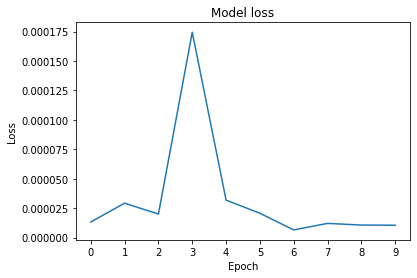

In [11]:
epoch_nums = 10
losses = []
    
for epoch in range(epoch_nums):
    running_loss = 0.0
    for i, data in enumerate(train_loader, 0):
       
        inputs_low, out_high = data
       
        reconstructed = autoencoder(inputs_low)
       
        loss = criterion(reconstructed, out_high)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss =+ loss.item()
    losses.append(running_loss / i)
    print(epoch)
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Model loss')
plt.xticks(range(epoch_nums))
plt.show()

# Plot The Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


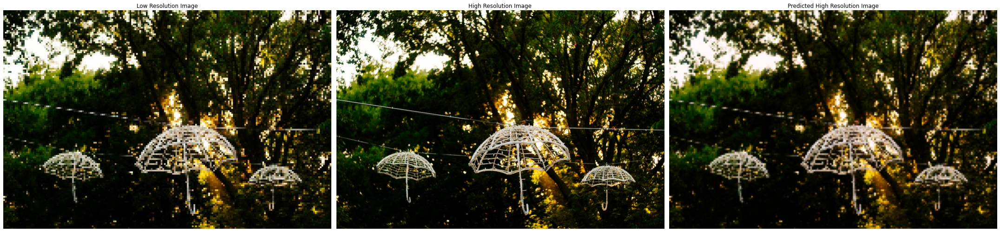

In [18]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


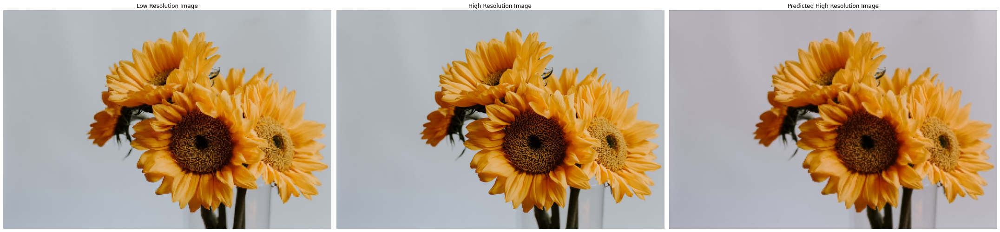

In [19]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

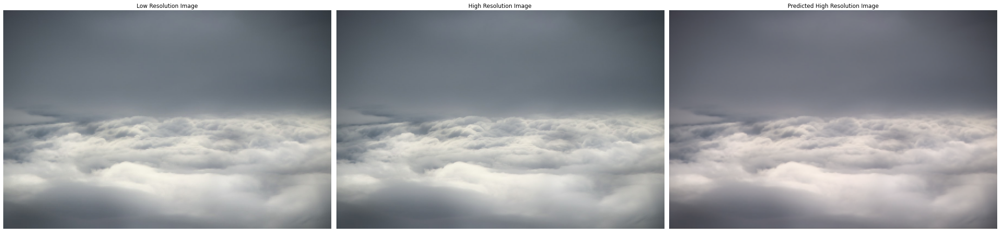

In [20]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


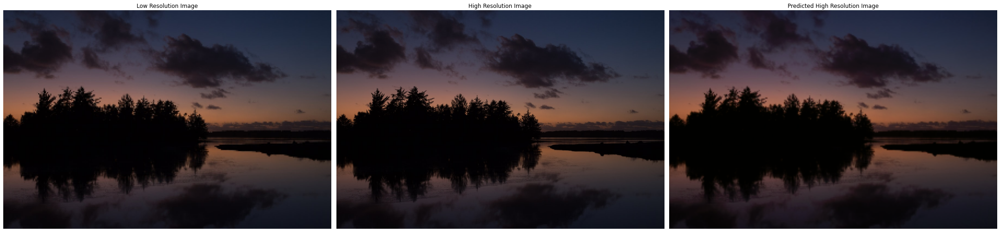

In [24]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

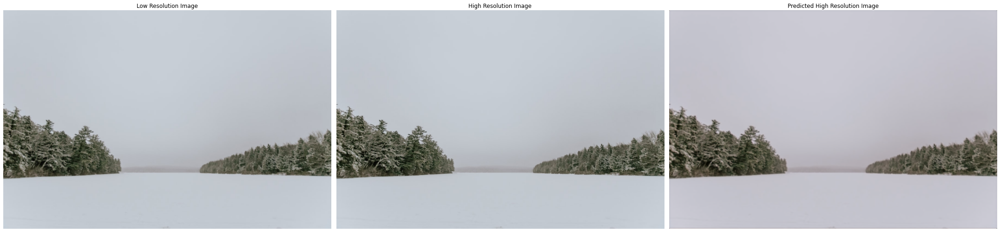

In [26]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


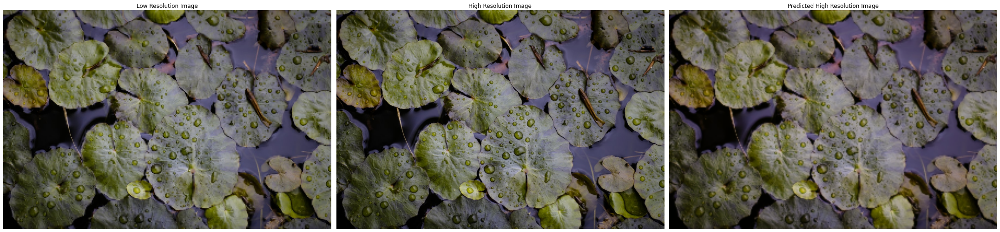

In [28]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


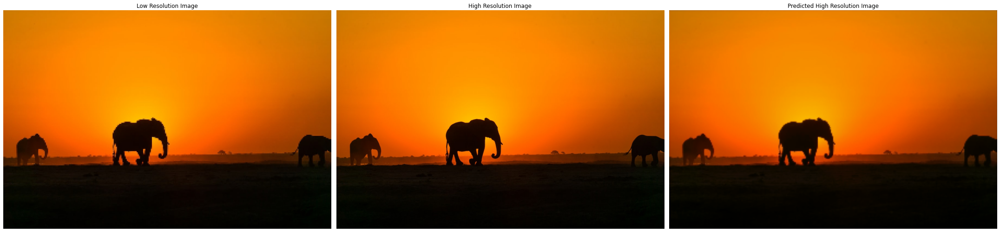

In [30]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


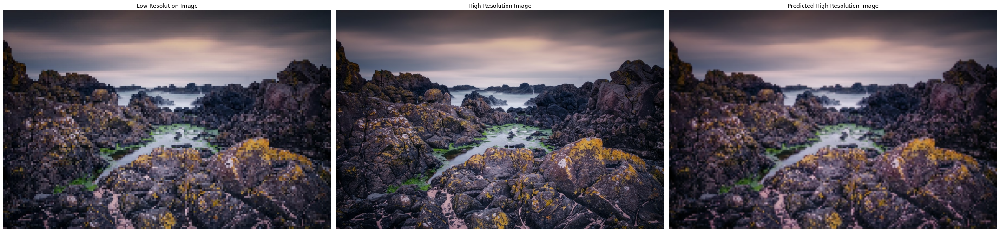

In [32]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


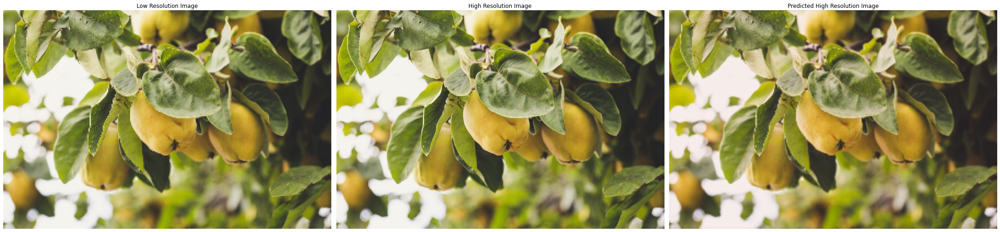

In [33]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


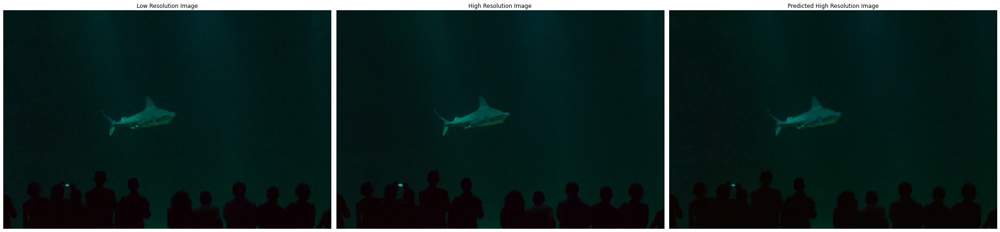

In [34]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


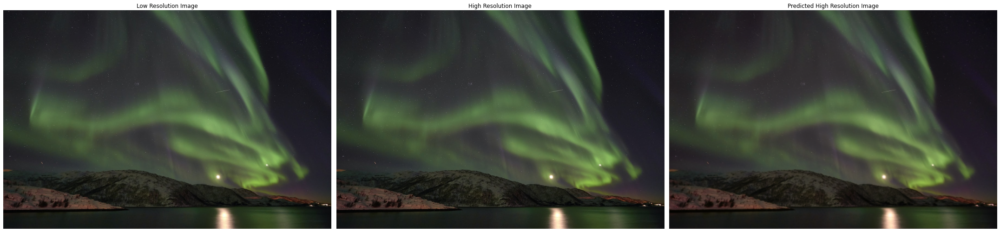

In [35]:
inputs_low, out_high = next(iter(test_loader))
output = autoencoder(inputs_low[0])
        
fig, axs = plt.subplots(1 , 3, figsize=(30,10))
axs[0].imshow(np.transpose(inputs_low[0], (1, 2, 0)))
axs[0].set_title('Low Resolution Image')
axs[0].axis('off')
axs[1].imshow(np.transpose(out_high[0], (1, 2, 0)))
axs[1].set_title('High Resolution Image')
axs[1].axis('off')
axs[2].imshow(np.transpose(output.clone().detach(), (1, 2, 0)))
axs[2].set_title('Predicted High Resolution Image')
axs[2].axis('off')

plt.tight_layout()
plt.show()